In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns
from importlib import reload
%matplotlib inline

import base
import utility

In [2]:
if True:
    data = pd.read_csv('fx_data/USDJPY/USDJPY_2000-201802_hour.csv', header=0)
    data['time'] = pd.to_datetime(data['time'], infer_datetime_format=True)

In [3]:
ta = None

r_periods = [1, 2, 6, 24, 120, 240, 480, 2400]
ta = base.TechnicalAnalysisCase(data)
ta.add_returns(r_periods)

ma_periods = [12, 24, 120, 240]
ta.add_SMA(ma_periods)
ta.add_EMA(ma_periods)

cross_periods1 = [24, 120]
cross_periods2 = [24, 240]
ta.add_MACrosses(cross_periods1, kind='SMA')
ta.add_MACrosses(cross_periods2, kind='SMA')

ta.add_BollingerBands(bollinger_period=15)
ta.add_MACD()
ta.add_RSI()

In [4]:
ta.data.columns

Index(['time', 'open', 'high', 'low', 'close', '-1P_return', '+1P_return',
       '-2P_return', '+2P_return', '-6P_return', '+6P_return', '-24P_return',
       '+24P_return', '-120P_return', '+120P_return', '-240P_return',
       '+240P_return', '-480P_return', '+480P_return', '-2400P_return',
       '+2400P_return', 'SMA12', 'SMA24', 'SMA120', 'SMA240', 'EMA12', 'EMA24',
       'EMA120', 'EMA240', 'SMA24_120_difference', 'SMA24_120_crosses',
       'SMA24_240_difference', 'SMA24_240_crosses', 'SMA15',
       'Bollinger15_sigma', 'Bollinger15_upper_2sigma',
       'Bollinger15_upper_3sigma', 'Bollinger15_lower_2sigma',
       'Bollinger15_lower_3sigma', 'EMA26', 'EMA9', 'MACD', 'MACD_signal',
       'MACD_histogram', 'MACD_cross', 'RSI14_change', 'RSI14_ave_gain',
       'RSI14_ave_loss', 'RS', 'RSI'],
      dtype='object')

In [5]:
ta.data.head(50)

,time,open,high,low,close,-1P_return,+1P_return,-2P_return,+2P_return,-6P_return,...,EMA9,MACD,MACD_signal,MACD_histogram,MACD_cross,RSI14_change,RSI14_ave_gain,RSI14_ave_loss,RS,RSI
0,2000-05-31 02:43:00,106.60,106.75,106.25,106.67,NaN,0.524984,NaN,0.703103,NaN,...,106.670000,0.000000,0.000000,0.000000,0,NaN,0.000000,0.000000,NaN,NaN
1,2000-05-31 04:34:00,106.63,107.49,106.61,107.23,0.524984,0.177189,NaN,0.503590,NaN,...,106.981111,0.012564,0.006980,0.005584,0,0.56,0.000000,0.000000,NaN,NaN
2,2000-05-31 09:07:00,107.25,107.59,107.22,107.42,0.177189,0.325824,0.703103,0.418916,NaN,...,107.160984,0.021901,0.013095,0.008806,0,0.19,0.000000,0.000000,NaN,NaN
3,2000-05-31 11:55:00,107.47,107.95,107.45,107.77,0.325824,0.092790,0.503590,-0.055674,NaN,...,107.367290,0.038248,0.021616,0.016632,0,0.35,0.000000,0.000000,NaN,NaN
4,2000-05-31 16:07:00,107.68,107.91,107.65,107.87,0.092790,-0.148327,0.418916,-0.018541,NaN,...,107.516835,0.050304,0.030150,0.020154,0,0.10,0.000000,0.000000,NaN,NaN
5,2000-05-31 19:19:00,107.83,107.83,106.43,107.71,-0.148327,0.129979,-0.055674,0.157831,NaN,...,107.569193,0.049764,0.035466,0.014298,0,-0.16,0.000000,0.000000,NaN,NaN
6,2000-05-31 20:40:00,107.67,107.92,107.67,107.85,0.129979,0.027816,-0.018541,0.120538,1.106215,...,107.640258,0.054903,0.040385,0.014518,0,0.14,0.000000,0.000000,NaN,NaN
7,2000-05-31 21:57:00,107.83,108.25,107.82,107.88,0.027816,0.092696,0.157831,0.500556,0.606174,...,107.697873,0.058893,0.044833,0.014060,0,0.03,0.000000,0.000000,NaN,NaN
8,2000-05-31 23:22:00,107.88,108.05,107.74,107.98,0.092696,0.407483,0.120538,0.759400,0.521318,...,107.763045,0.065721,0.049658,0.016063,0,0.10,0.000000,0.000000,NaN,NaN
9,2000-06-01 02:00:00,107.99,108.45,107.95,108.42,0.407483,0.350489,0.500556,0.507286,0.603136,...,107.910241,0.092273,0.059207,0.033066,0,0.44,0.000000,0.000000,NaN,NaN


In [6]:
ta.data.describe()

,open,high,low,close,-1P_return,+1P_return,-2P_return,+2P_return,-6P_return,+6P_return,...,EMA9,MACD,MACD_signal,MACD_histogram,MACD_cross,RSI14_change,RSI14_ave_gain,RSI14_ave_loss,RS,RSI
count,96779.000000,96779.000000,96779.000000,96779.000000,96778.000000,96778.000000,96777.000000,96777.000000,96773.000000,96773.000000,...,96779.000000,96779.000000,96779.000000,96779.000000,96779.000000,96778.000000,96779.000000,96779.000000,96766.000000,96766.000000
mean,105.657949,105.756236,105.557918,105.657920,0.000096,0.000096,0.000183,0.000183,0.000499,0.000499,...,105.657966,-0.000112,-0.000109,-0.000003,0.000000,-0.000004,0.048324,0.048328,1.175661,50.401352
std,13.708467,13.717602,13.699986,13.708467,0.141047,0.141047,0.198202,0.198202,0.337196,0.337196,...,13.706768,0.163113,0.153702,0.048840,0.273666,0.148037,0.024642,0.027127,0.703767,12.443172
min,75.630000,75.750000,75.560000,75.630000,-3.633239,-3.633239,-4.128362,-4.128362,-5.610477,-5.610477,...,75.725843,-1.341004,-1.108634,-0.609861,-1.000000,-3.806000,0.000000,0.000000,0.077468,7.189810
25%,97.366500,97.500500,97.248500,97.369000,-0.060412,-0.060412,-0.086562,-0.086562,-0.161160,-0.161160,...,97.400019,-0.086838,-0.081865,-0.026538,0.000000,-0.061000,0.032043,0.030461,0.717409,41.772743
50%,108.490000,108.610000,108.384000,108.490000,0.000000,0.000000,0.000000,0.000000,0.001799,0.001799,...,108.516462,0.001238,0.000963,-0.000133,0.000000,0.000000,0.043947,0.043103,1.008663,50.215645
75%,117.190000,117.300000,117.090000,117.190000,0.063473,0.063473,0.090293,0.090293,0.164426,0.164426,...,117.180254,0.093364,0.089094,0.026120,0.000000,0.068000,0.059211,0.059609,1.442913,59.065268
max,134.900000,135.400000,134.750000,134.900000,3.794790,3.794790,4.707127,4.707127,4.953765,4.953765,...,134.702889,1.154848,0.947491,0.416566,1.000000,2.870000,0.373416,0.427012,13.778101,93.233231


# Overall Price Movment during the whole period

In [7]:
df = data.iloc[:, :5].set_index('time')

In [8]:
utility.plot_candlestick(df.iloc[:96779])

/home/ryohayama/.local/lib/python3.6/site-packages/pandas/core/indexing.py:357: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/home/ryohayama/.local/lib/python3.6/site-packages/pandas/core/indexing.py:621: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item_labels[indexer[info_axis]]] = value


Loading BokehJS ...

# Analysis of Returns

In [9]:
plus_labels = [col for col in ta.data.columns if 'return' in col and '+' in col]
minus_labels = [col for col in ta.data.columns if 'return' in col and '-' in col]
print(plus_labels)
print(minus_labels)

['+1P_return', '+2P_return', '+6P_return', '+24P_return', '+120P_return', '+240P_return', '+480P_return', '+2400P_return']
['-1P_return', '-2P_return', '-6P_return', '-24P_return', '-120P_return', '-240P_return', '-480P_return', '-2400P_return']


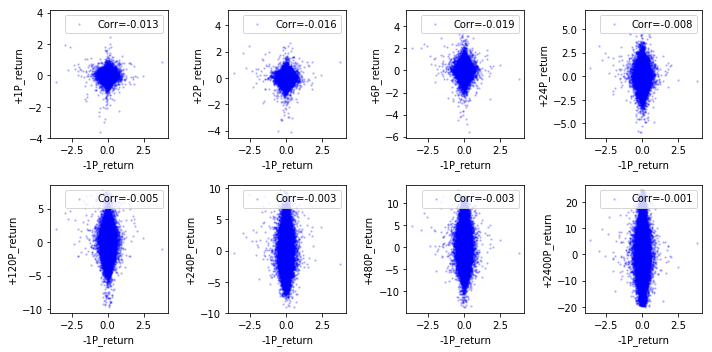

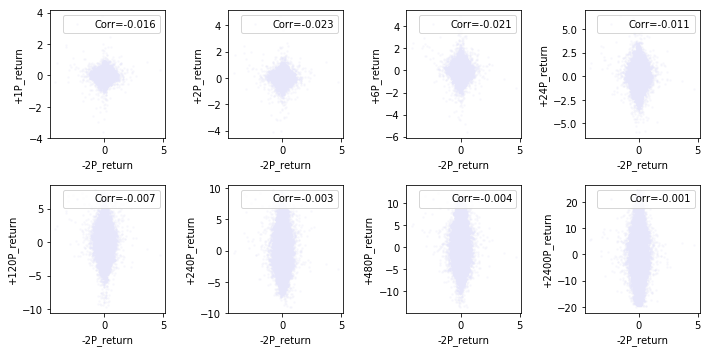

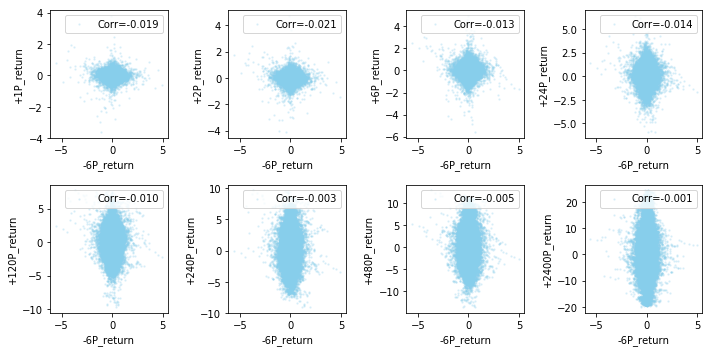

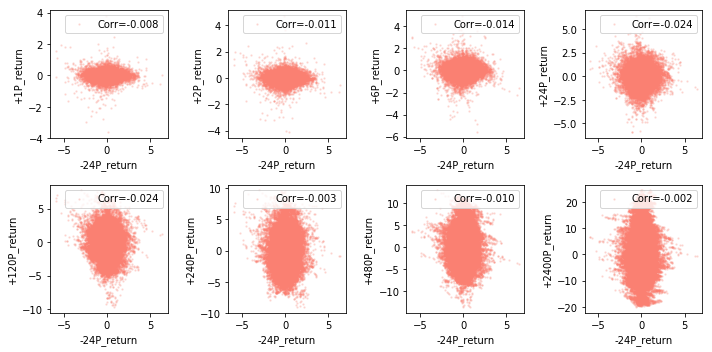

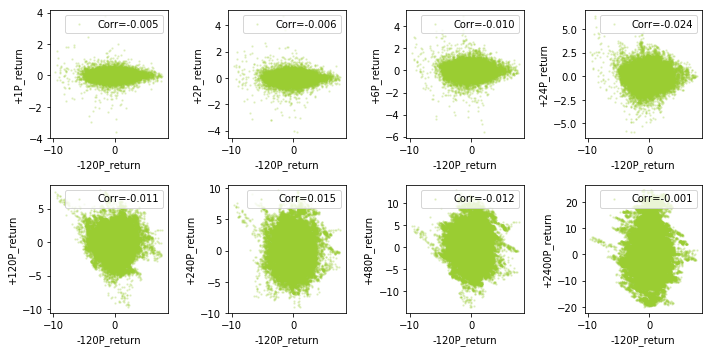

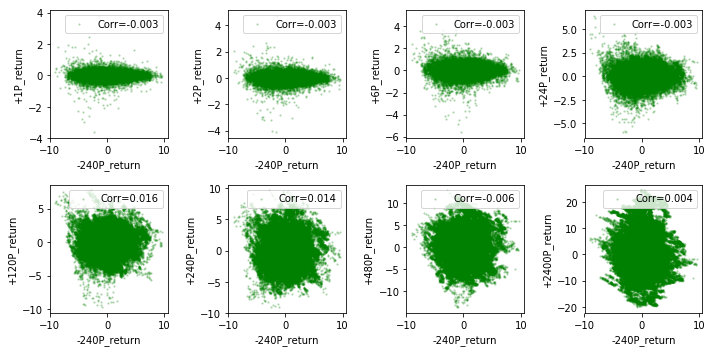

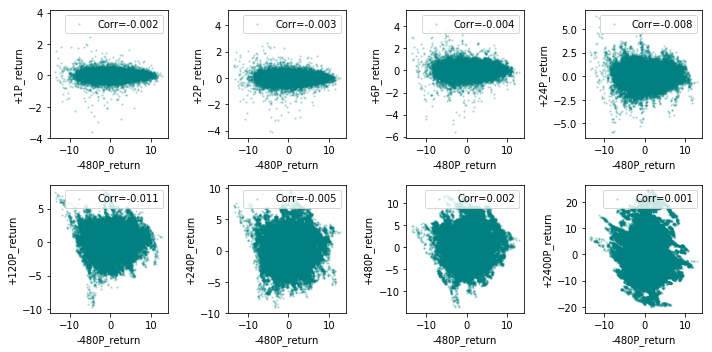

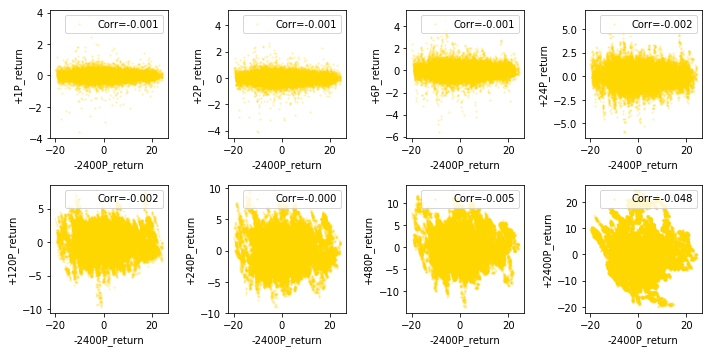

In [10]:
colors = ['blue', 'lavender', 'skyblue', 'salmon', 'yellowgreen', 'green', 'teal', 'gold']
for i, minus_r in enumerate(minus_labels):
    fig = plt.figure(figsize=(10, 5))
    for j, plus_r in enumerate(plus_labels):
        ax = fig.add_subplot(2, 4, j+1)
        pearson = ta.data[minus_r].corr(ta.data[plus_r])
        ax.scatter(ta.data[minus_r], ta.data[plus_r], color=colors[i], s=2, alpha=0.2, label=('Corr=%.3f' % pearson))
        ax.set_xlabel(minus_r)
        ax.set_ylabel(plus_r)
        ax.legend(loc='upper right')
    plt.tight_layout()

KeyboardInterrupt: 

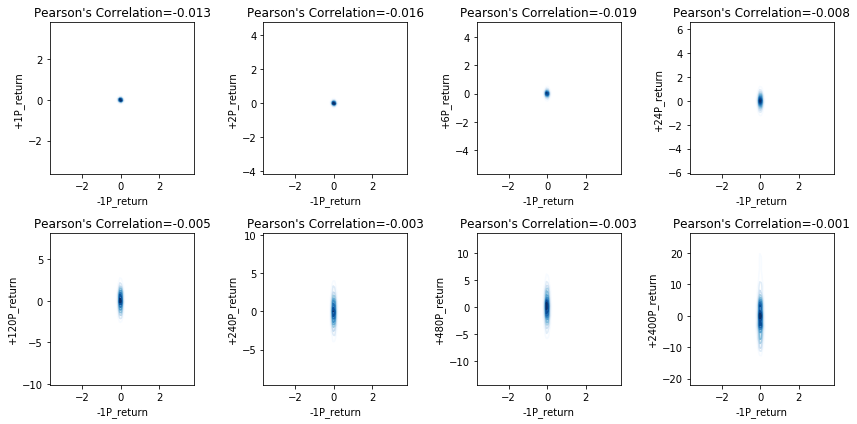

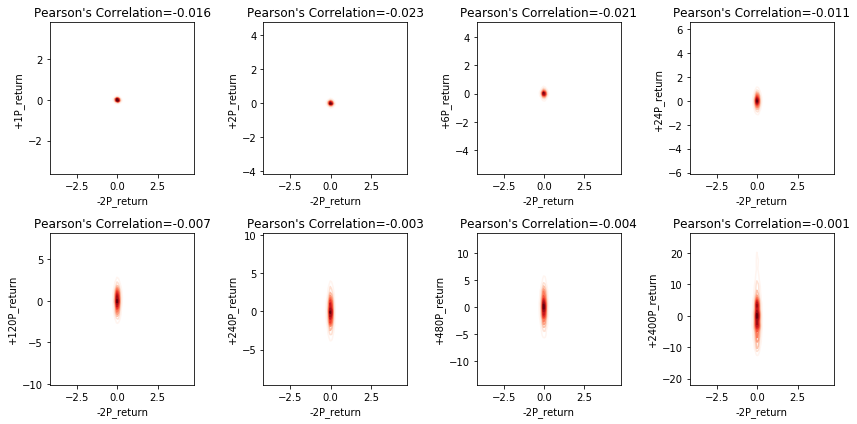

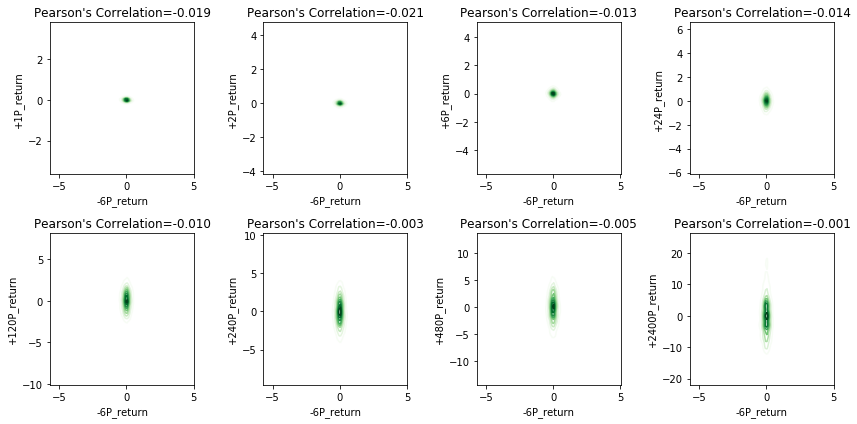

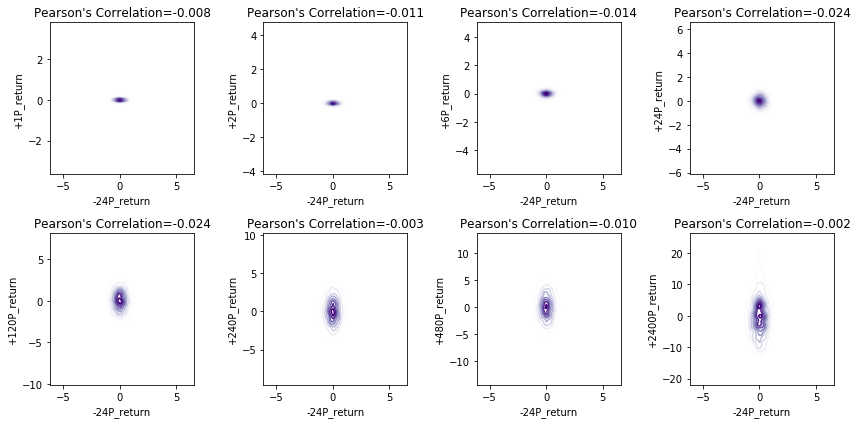

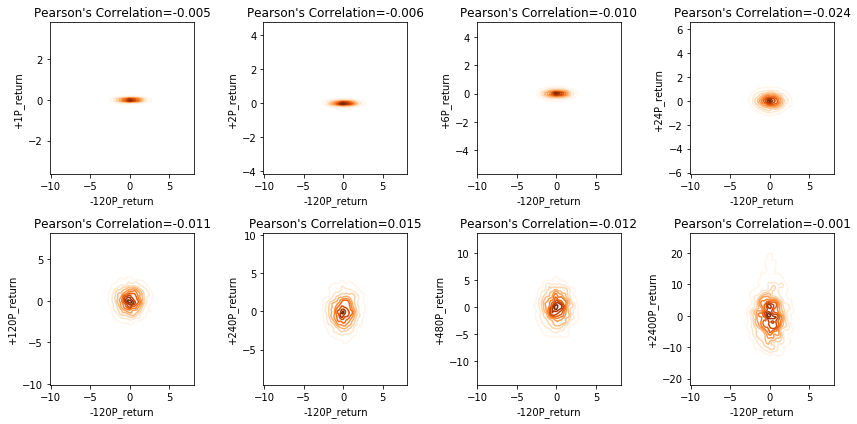

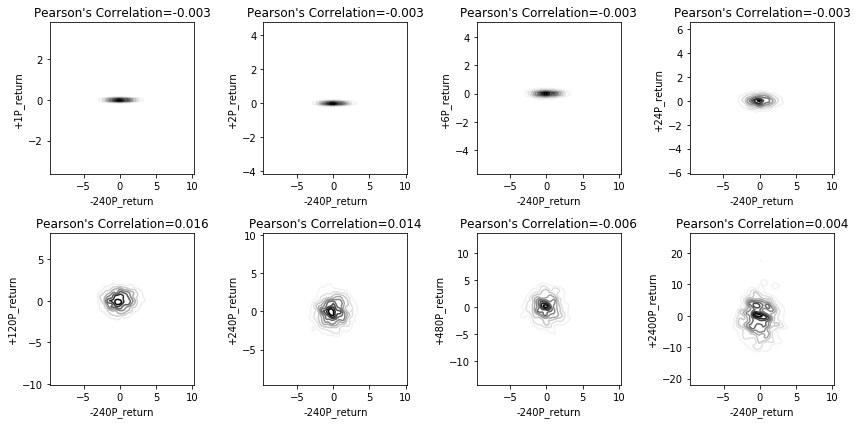

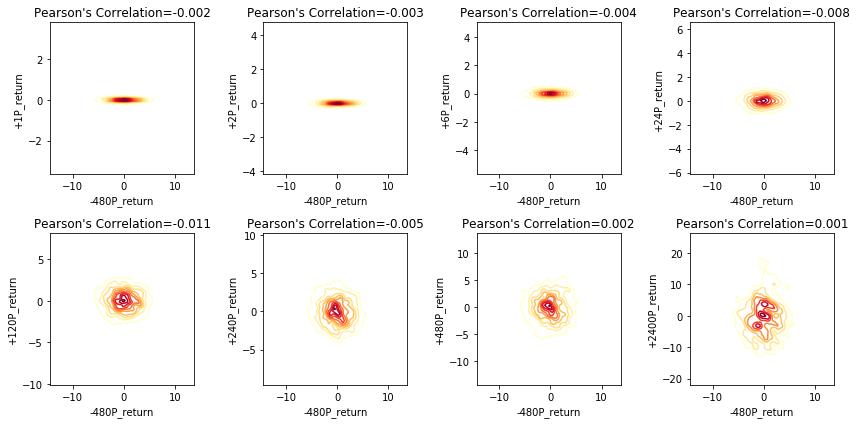

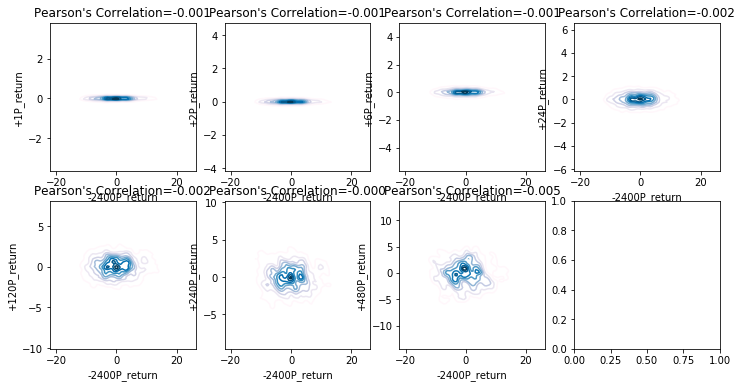

In [11]:
%%time
cmaps = ['Blues', 'Reds', 'Greens', 'Purples', 'Oranges', 'Greys', 'YlOrRd', 'PuBu']
for i, minus_r in enumerate(minus_labels):
    fig = plt.figure(figsize=(12, 6))
    for j, plus_r in enumerate(plus_labels):
        ax = fig.add_subplot(2, 4, j+1)
        df = pd.concat([ta.data[minus_r], ta.data[plus_r]], axis=1).dropna()
        sns.kdeplot(df.iloc[:, 0], df.iloc[:, 1], cmap=cmaps[i], ax=ax)
        ax.set_xlabel(minus_r)
        ax.set_ylabel(plus_r)
        pearson = ta.data[minus_r].corr(ta.data[plus_r])
        ax.set_title('Pearson\'s Correlation=%.3f' % pearson)
    plt.tight_layout()

# Moving Averages and Their Crosses

### SMA24 vs SMA120 (1 day vs 5 day SMAs)

===== 1period_return ===============
Golden Cross Return (%): -0.00 +/- 0.13
Death  Cross Return (%): 0.01 +/- 0.13
===== 2period_return ===============
Golden Cross Return (%): 0.00 +/- 0.19
Death  Cross Return (%): 0.02 +/- 0.19
===== 6period_return ===============
Golden Cross Return (%): 0.01 +/- 0.34
Death  Cross Return (%): 0.01 +/- 0.34
===== 24period_return ===============
Golden Cross Return (%): 0.01 +/- 0.71
Death  Cross Return (%): 0.00 +/- 0.68
===== 120period_return ===============
Golden Cross Return (%): -0.11 +/- 1.48
Death  Cross Return (%): -0.09 +/- 1.46
===== 240period_return ===============
Golden Cross Return (%): -0.16 +/- 2.12
Death  Cross Return (%): -0.14 +/- 1.99
===== 480period_return ===============
Golden Cross Return (%): -0.18 +/- 2.99
Death  Cross Return (%): -0.22 +/- 2.94
===== 2400period_return ===============
Golden Cross Return (%): 0.02 +/- 6.76
Death  Cross Return (%): -0.04 +/- 6.68
===== Numer of Cases for SMA24_120_crosses =====
Total Numbe o

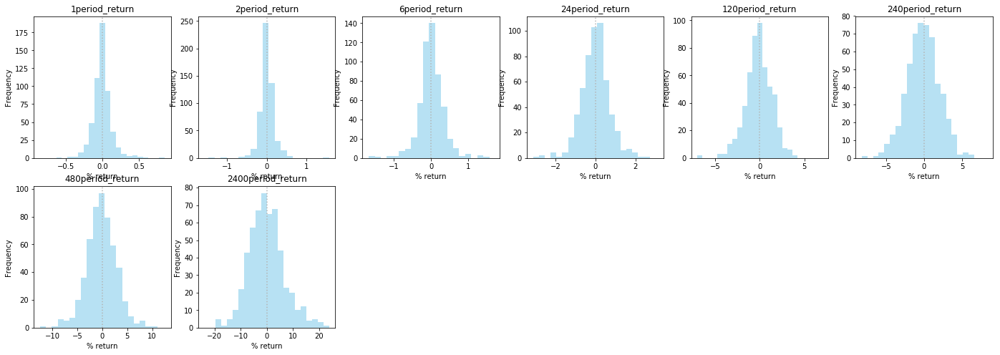

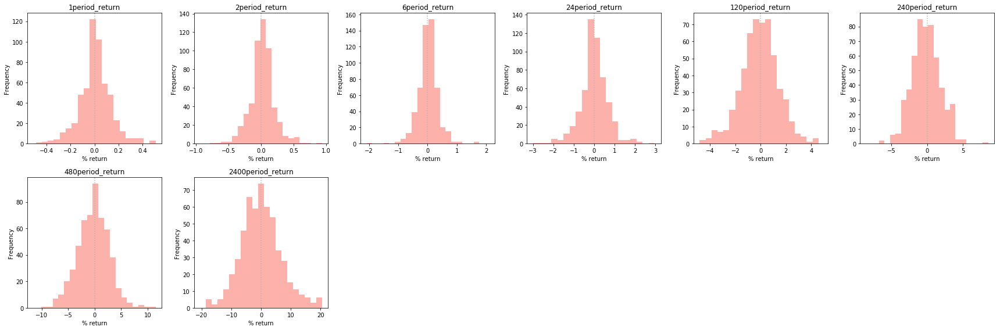

In [12]:
eval_periods = [1, 2, 6, 24, 120, 240, 480, 2400]
res_macross1 = utility.eval_metric_performance(ta.data['close'], ta.data['SMA24_120_crosses'], eval_periods)
utility.plot_performance_mpl(res_macross1, 'SMA24_120_crosses', bins=20, eval_periods=eval_periods)

### SMA24 vs SMA240 (1 day vs 10 day SMAs)

===== 1period_return ===============
Golden Cross Return (%): -0.02 +/- 0.15
Death  Cross Return (%): 0.00 +/- 0.13
===== 2period_return ===============
Golden Cross Return (%): -0.03 +/- 0.19
Death  Cross Return (%): 0.01 +/- 0.21
===== 6period_return ===============
Golden Cross Return (%): -0.03 +/- 0.41
Death  Cross Return (%): 0.01 +/- 0.42
===== 24period_return ===============
Golden Cross Return (%): -0.06 +/- 0.67
Death  Cross Return (%): -0.02 +/- 0.69
===== 120period_return ===============
Golden Cross Return (%): -0.12 +/- 1.54
Death  Cross Return (%): -0.13 +/- 1.48
===== 240period_return ===============
Golden Cross Return (%): -0.11 +/- 2.11
Death  Cross Return (%): -0.06 +/- 2.13
===== 480period_return ===============
Golden Cross Return (%): 0.03 +/- 2.83
Death  Cross Return (%): -0.01 +/- 2.95
===== 2400period_return ===============
Golden Cross Return (%): 0.27 +/- 6.80
Death  Cross Return (%): 0.21 +/- 6.78
===== Numer of Cases for SMA24_240_crosses =====
Total Numbe

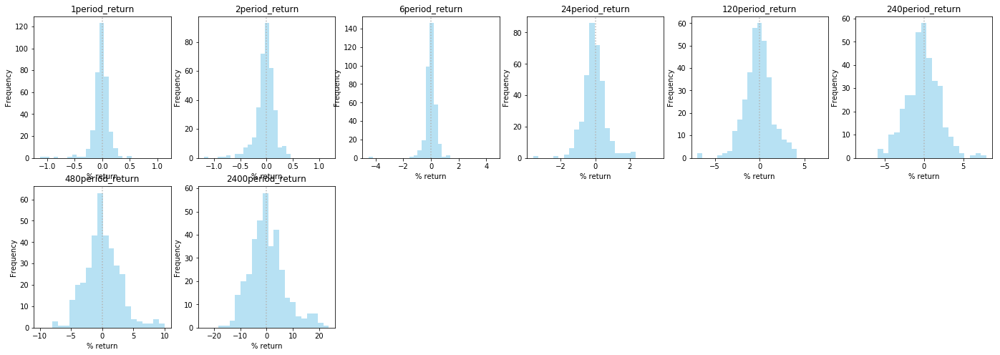

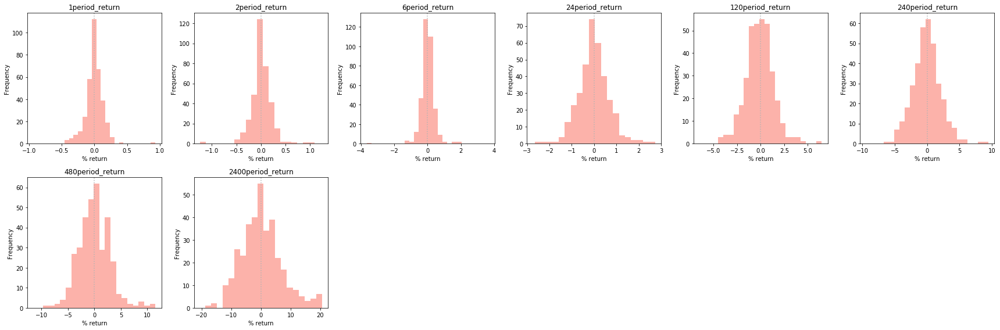

In [13]:
eval_periods = [1, 2, 6, 24, 120, 240, 480, 2400]
res_macross2 = utility.eval_metric_performance(ta.data['close'], ta.data['SMA24_240_crosses'], eval_periods)
utility.plot_performance_mpl(res_macross2, 'SMA24_240_crosses', bins=20, eval_periods=eval_periods)

# MACD

In [14]:
return_labels = [col for col in ta.data.columns if 'return' in col and '+' in col]
return_labels

['+1P_return',
 '+2P_return',
 '+6P_return',
 '+24P_return',
 '+120P_return',
 '+240P_return',
 '+480P_return',
 '+2400P_return']

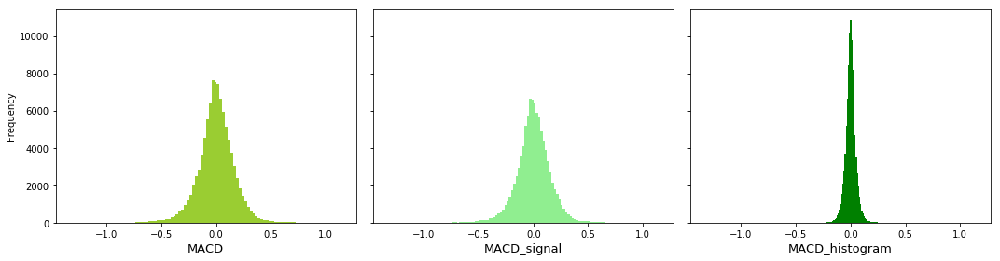

In [15]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4), sharex=True, sharey=True)
ta.data.MACD.plot(kind='hist', bins=100, color='yellowgreen', ax=ax1)
ta.data.MACD_signal.plot(kind='hist', bins=100, color='lightgreen', ax=ax2)
ta.data.MACD_histogram.plot(kind='hist', bins=100, color='green', ax=ax3)
ax1.set_xlabel('MACD', fontsize=13)
ax2.set_xlabel('MACD_signal', fontsize=13)
ax3.set_xlabel('MACD_histogram', fontsize=13)
plt.tight_layout()

===== 1period_return ===============
Golden Cross Return (%): 0.00 +/- 0.15
Death  Cross Return (%): -0.01 +/- 0.15
===== 2period_return ===============
Golden Cross Return (%): -0.00 +/- 0.21
Death  Cross Return (%): -0.00 +/- 0.20
===== 6period_return ===============
Golden Cross Return (%): -0.00 +/- 0.35
Death  Cross Return (%): -0.01 +/- 0.35
===== 24period_return ===============
Golden Cross Return (%): 0.02 +/- 0.67
Death  Cross Return (%): -0.01 +/- 0.67
===== 120period_return ===============
Golden Cross Return (%): 0.04 +/- 1.46
Death  Cross Return (%): 0.00 +/- 1.49
===== 240period_return ===============
Golden Cross Return (%): 0.06 +/- 2.09
Death  Cross Return (%): 0.04 +/- 2.10
===== 480period_return ===============
Golden Cross Return (%): 0.08 +/- 2.95
Death  Cross Return (%): 0.06 +/- 2.96
===== 2400period_return ===============
Golden Cross Return (%): 0.33 +/- 6.82
Death  Cross Return (%): 0.32 +/- 6.83
===== Numer of Cases for MACD_cross =====
Total Numbe of Periods

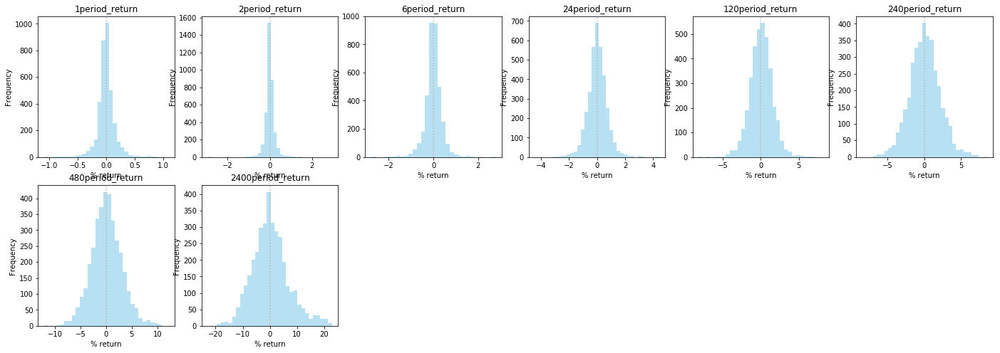

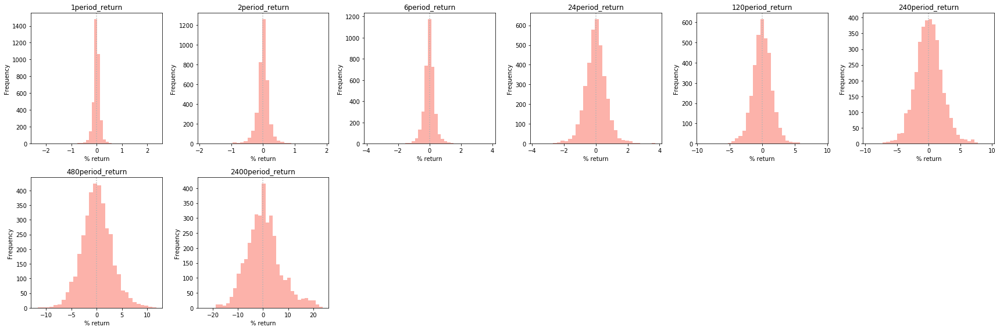

In [16]:
eval_periods = [1, 2, 6, 24, 120, 240, 480, 2400]
res_macd1 = utility.eval_metric_performance(ta.data['close'], ta.data['MACD_cross'], eval_periods)
utility.plot_performance_mpl(res_macd1, 'MACD_cross', bins=30, eval_periods=eval_periods)

# RSI

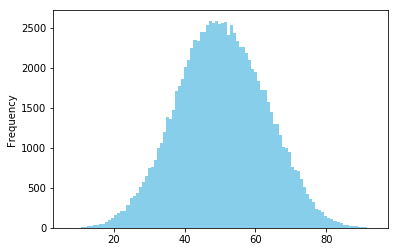

In [17]:
ta.data.RSI.plot(kind='hist', bins=100, color='skyblue')

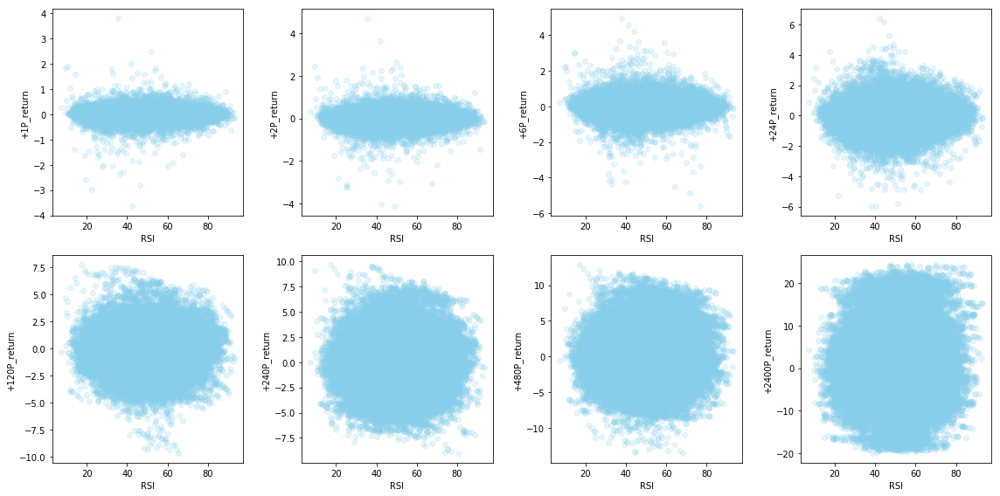

In [18]:
fig = plt.figure(figsize=(16, 8))
for i, r in enumerate(return_labels):
    ax = fig.add_subplot(2, 4, i+1)
    ax.scatter(ta.data.RSI, ta.data[r], color='skyblue', alpha=0.2)
    ax.set_xlabel('RSI')
    ax.set_ylabel(r)
plt.tight_layout()

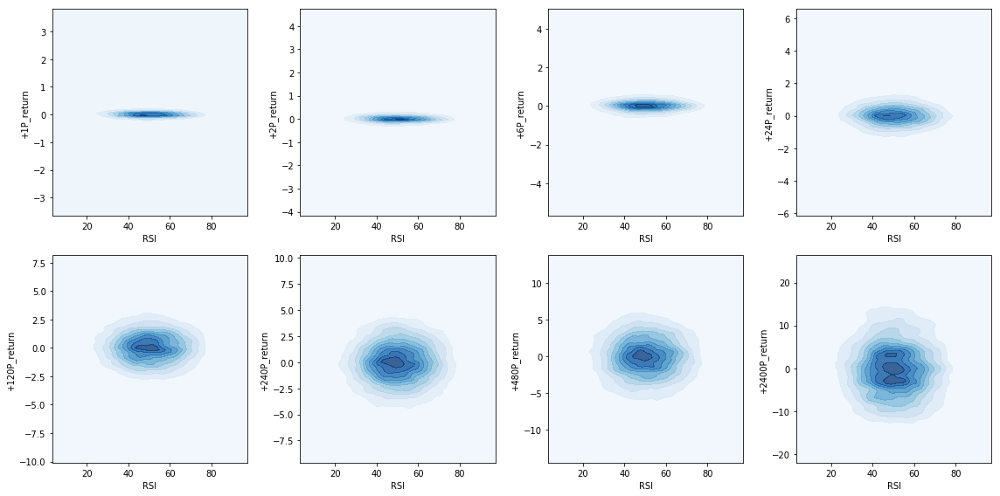

In [19]:
fig = plt.figure(figsize=(16, 8))
for i, r in enumerate(return_labels):
    ax = fig.add_subplot(2, 4, i+1)
    df = pd.concat([ta.data.RSI,  ta.data[r]], axis=1).dropna()
    sns.kdeplot(df.iloc[:, 0], df.iloc[:, 1],
                        cmap="Blues", shade=True, shade_lowest=True, alpha=0.8)
    ax.set_xlabel('RSI')
    ax.set_ylabel(r)
plt.tight_layout()

KeyboardInterrupt: 

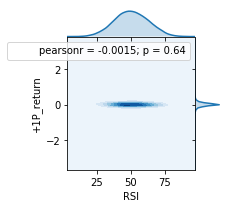

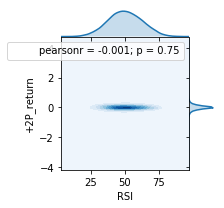

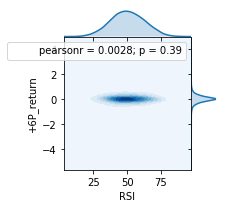

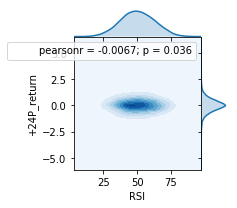

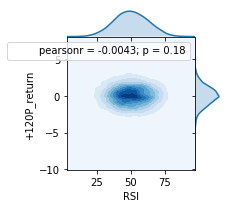

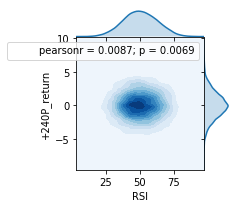

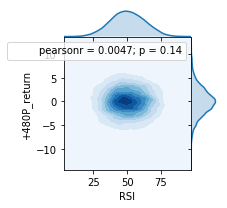

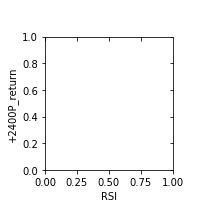

In [20]:
for i, r in enumerate(return_labels):
    df = pd.concat([ta.data.RSI,  ta.data[r]], axis=1).dropna()
    ax = sns.jointplot(df.iloc[:, 0], df.iloc[:, 1], kind="kde", size=3, space=0, cmap="Blues")

# MACD metrics vs RSI

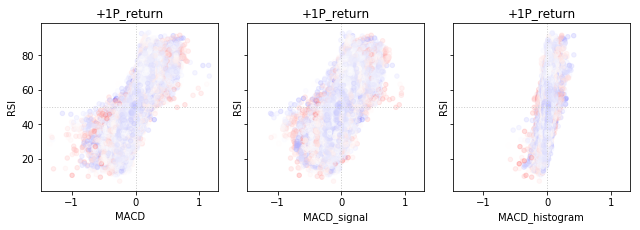

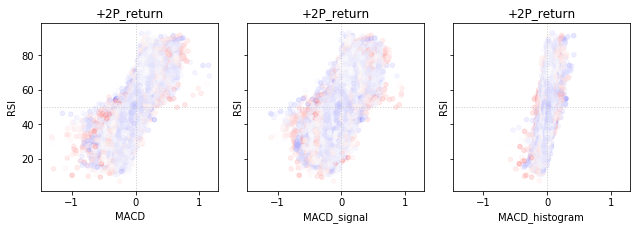

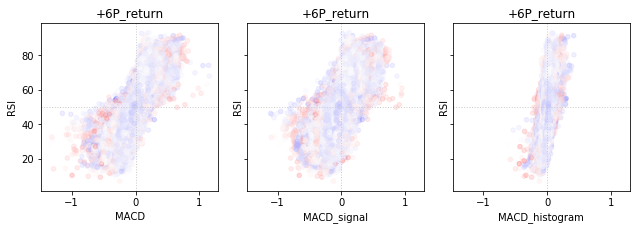

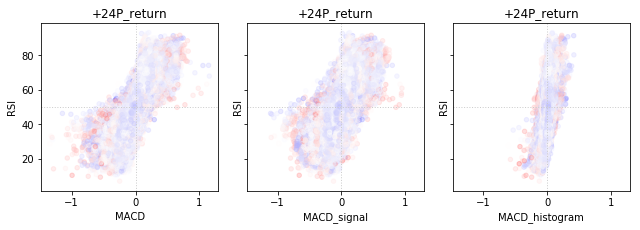

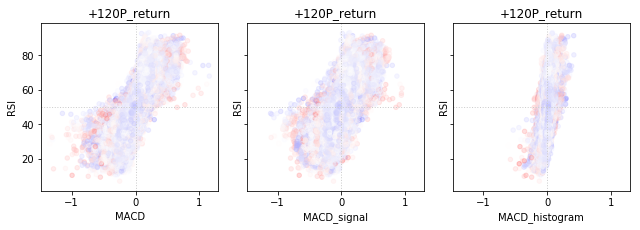

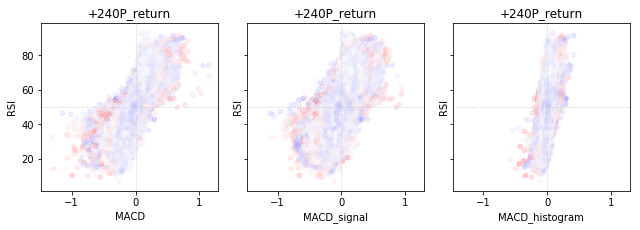

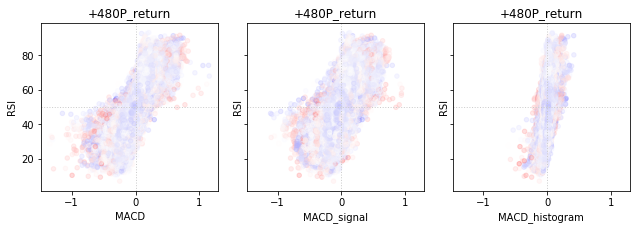

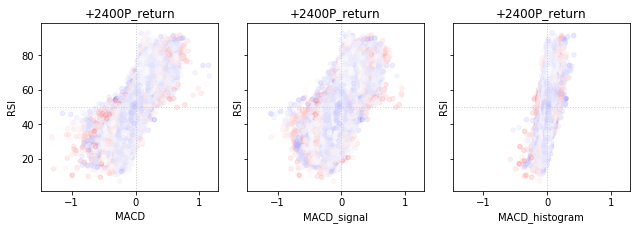

In [21]:
s = 20
alpha = 0.3
cmap = "bwr"

for r in return_labels:
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3.3), sharex=True, sharey=True)
    ax1.axvline(0, color='0.8', ls=':', lw=1)
    ax1.axhline(50, color='0.8', ls=':', lw=1)
    ax1.scatter(ta.data['MACD'], ta.data['RSI'], s=s, alpha=alpha, c=ta.data['+24P_return'], cmap=cmap)
    ax1.set_xlabel('MACD')
    ax1.set_ylabel('RSI')
    ax1.set_title(r)

    ax2.axvline(0, color='0.8', ls=':', lw=1)
    ax2.axhline(50, color='0.8', ls=':', lw=1)
    ax2.scatter(ta.data['MACD_signal'], ta.data['RSI'], s=s, alpha=alpha, c=ta.data['+24P_return'], cmap=cmap)
    ax2.set_xlabel('MACD_signal')
    ax2.set_ylabel('RSI')
    ax2.set_title(r)

    ax3.axvline(0, color='0.8', ls=':', lw=1)
    ax3.axhline(50, color='0.8', ls=':', lw=1)
    ax3.scatter(ta.data['MACD_histogram'], ta.data['RSI'], s=s, alpha=alpha, c=ta.data['+24P_return'], cmap=cmap)
    ax3.set_xlabel('MACD_histogram')
    ax3.set_ylabel('RSI')
    ax3.set_title(r)
    
    plt.tight_layout()